In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
#download data
!git clone https://github.com/Kai6704/Autonomous-vehicles.git

fatal: destination path 'Autonomous-vehicles' already exists and is not an empty directory.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Lambda, Cropping2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import albumentations as A
import cv2
import pandas as pd
import ntpath
import random
import pandas as pd
import ntpath
import random

In [ ]:
datadir = 'Autonomous-vehicles'
columns =['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,0.0,0.0,0.0,0.000009
1,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,0.0,0.0,0.0,0.000009
2,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,0.0,0.0,0.0,0.000006
3,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,0.0,0.0,0.0,0.000015
4,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,D:\Autonomous vehicles project\Autonomous-vehi...,0.0,0.0,0.0,0.000014


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_05_31_14_17_54_433.jpg,left_2025_05_31_14_17_54_433.jpg,right_2025_05_31_14_17_54_433.jpg,0.0,0.0,0.0,0.000009
1,center_2025_05_31_14_17_54_496.jpg,left_2025_05_31_14_17_54_496.jpg,right_2025_05_31_14_17_54_496.jpg,0.0,0.0,0.0,0.000009
2,center_2025_05_31_14_17_54_590.jpg,left_2025_05_31_14_17_54_590.jpg,right_2025_05_31_14_17_54_590.jpg,0.0,0.0,0.0,0.000006
3,center_2025_05_31_14_17_54_658.jpg,left_2025_05_31_14_17_54_658.jpg,right_2025_05_31_14_17_54_658.jpg,0.0,0.0,0.0,0.000015
4,center_2025_05_31_14_17_54_746.jpg,left_2025_05_31_14_17_54_746.jpg,right_2025_05_31_14_17_54_746.jpg,0.0,0.0,0.0,0.000014


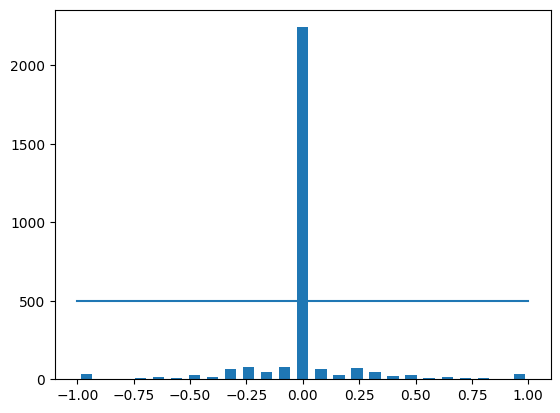

In [ ]:
num_bins = 25
samples_per_bin = 500
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data: ', len(data))
print(data.shape)

total data:  2947
(2947, 7)


In [ ]:
remove_list=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed: ', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining: ', len(data))

removed:  1743
remaining:  1204


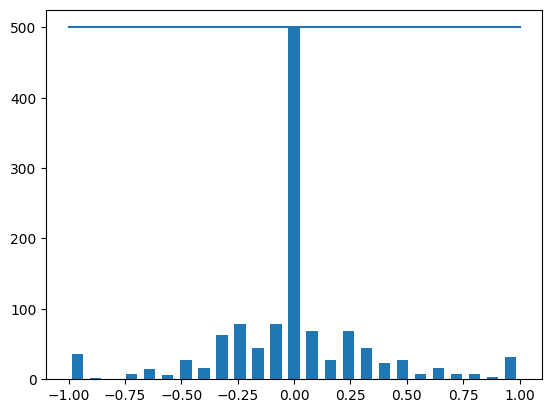

In [ ]:
num_bins = 25
samples_per_bin = 500
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_steering(datadir, df):
  image_path=[]
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    #center image append
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    #left image append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    #right image append
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

<ipython-input-14-0574e30ed92c>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-14-0574e30ed92c>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-14-0574e30ed92c>:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3])+0.15)
<ipython-input-14-0574e30ed92c>:15:

In [ ]:
len(image_paths)
image_paths

array(['Autonomous-vehicles/IMG/center_2025_05_31_14_17_54_496.jpg',
       'Autonomous-vehicles/IMG/left_2025_05_31_14_17_54_496.jpg',
       'Autonomous-vehicles/IMG/right_2025_05_31_14_17_54_496.jpg', ...,
       'Autonomous-vehicles/IMG/center_2025_05_31_14_21_41_867.jpg',
       'Autonomous-vehicles/IMG/left_2025_05_31_14_21_41_867.jpg',
       'Autonomous-vehicles/IMG/right_2025_05_31_14_21_41_867.jpg'],
      dtype='<U58')

In [ ]:
len(steerings)

3612

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 2889
Valid Samples: 723


(array([  3.,   7.,   2.,  10.,   6.,   8.,   7.,  23.,  33.,  34., 141.,
         39., 119.,  43., 117.,  34.,  35.,  11.,   7.,  19.,   6.,   5.,
          4.,   4.,   6.]),
 array([-1.15 , -1.058, -0.966, -0.874, -0.782, -0.69 , -0.598, -0.506,
        -0.414, -0.322, -0.23 , -0.138, -0.046,  0.046,  0.138,  0.23 ,
         0.322,  0.414,  0.506,  0.598,  0.69 ,  0.782,  0.874,  0.966,
         1.058,  1.15 ]),
 <BarContainer object of 25 artists>)

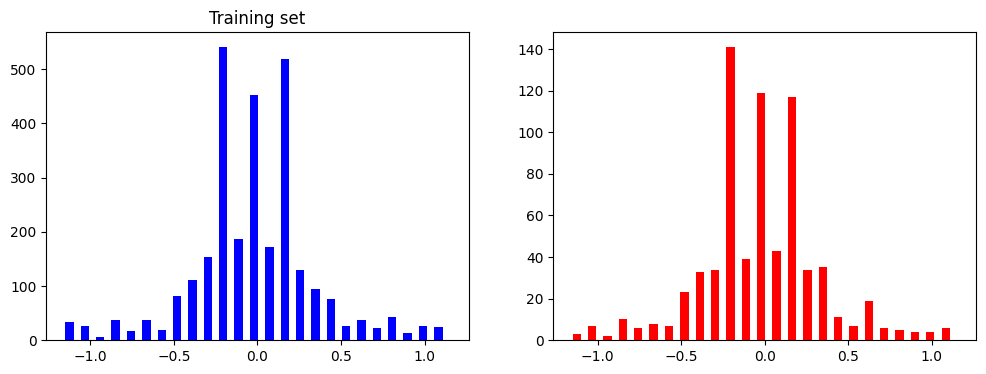

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')

Text(0.5, 1.0, 'Zoomed Image')

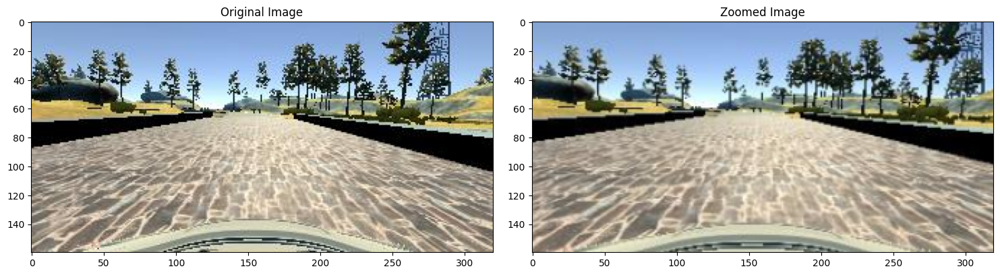

In [ ]:
def zoom(image):
    transform = A.Compose([
        A.Affine(scale=(1.0, 1.3))
    ])
    augmented = transform(image=image)
    return augmented['image']

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

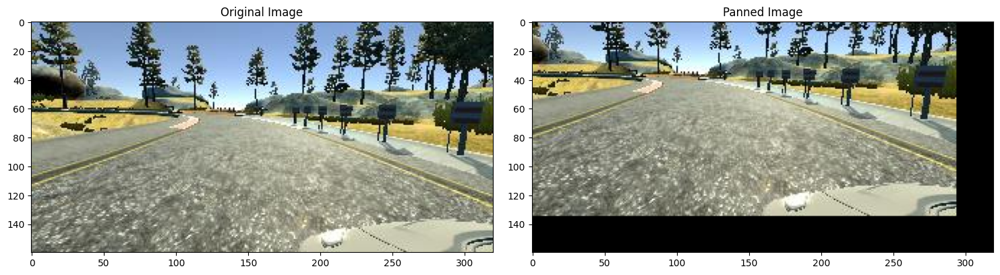

In [ ]:
def pan(image):
    transform = A.Compose([
        A.Affine(translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)})
    ])
    augmented = transform(image=image)
    return augmented["image"]

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Bright Image')

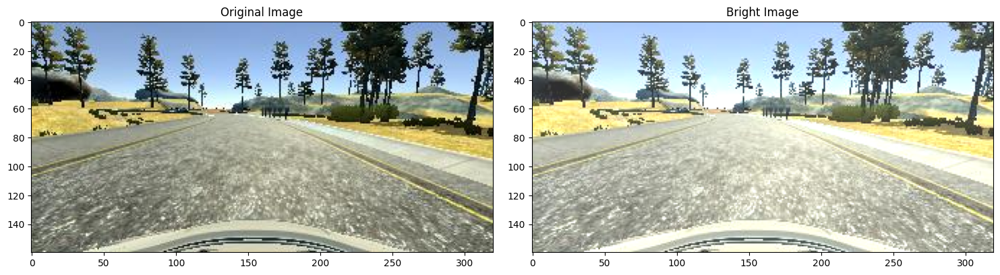

In [ ]:
def img_random_brightness(image):
    transform = A.Compose([
        A.RandomBrightnessContrast(brightness_limit=0.8, contrast_limit=0.0, p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
bright_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(bright_image)
axs[1].set_title('Bright Image')

Text(0.5, 1.0, 'Flipped Image')

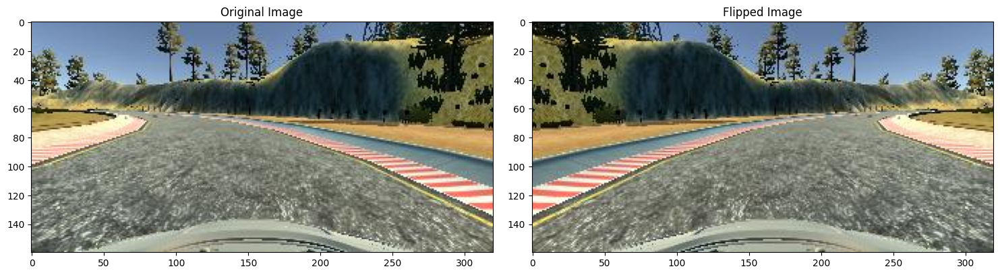

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image')

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

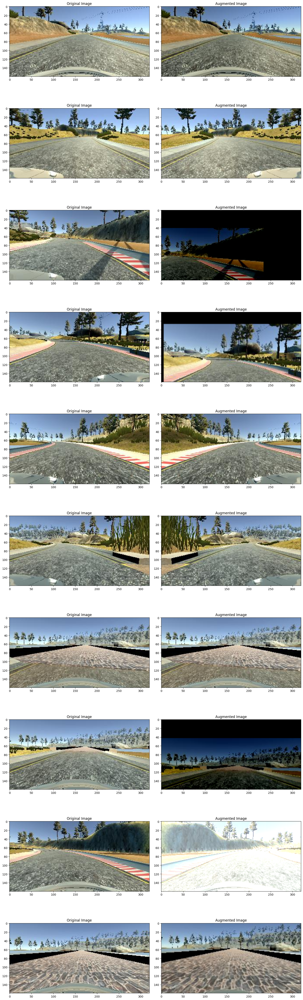

In [ ]:
ncol =2
nrow =10

fig, axs = plt.subplots(nrow, ncol, figsize=(15,50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths)-1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title('Original Image')
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title('Augmented Image')

In [ ]:
def img_preprocess(img):
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

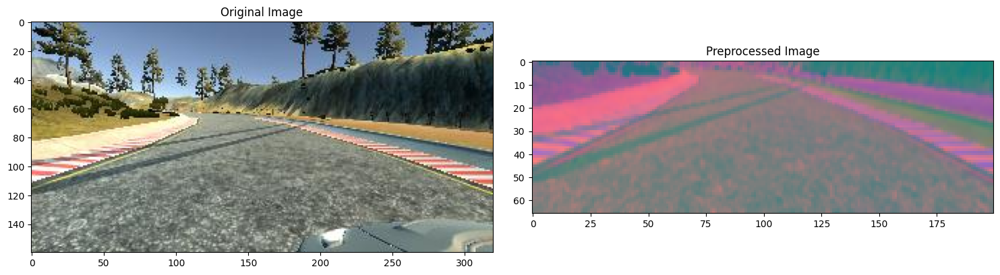

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, is_training):
  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index =random.randint(0, len(image_paths)-1)

      if is_training:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

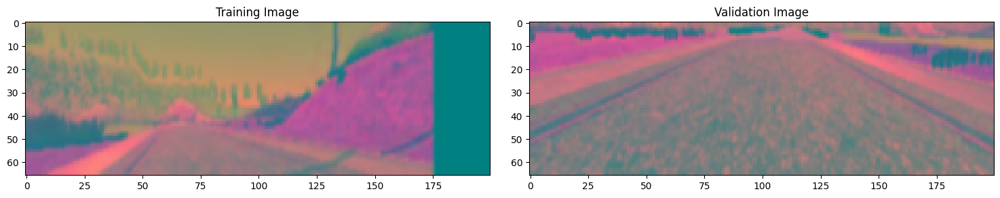

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
  def nvidia_model():
      model = Sequential()
      model.add(Conv2D(24, (5, 5), strides=(2, 2), activation='elu', input_shape=(66, 200, 3)))
      model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
      model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
      model.add(Conv2D(64, (3, 3), activation='elu'))
      model.add(Conv2D(64, (3, 3), activation='elu'))
      model.add(Flatten())
      model.add(Dense(100, activation='elu'))
      model.add(Dense(50, activation='elu'))
      model.add(Dense(10, activation='elu'))
      model.add(Dense(1))

      model.compile(loss=MeanSquaredError(), optimizer='adam')
      return model

In [ ]:
model = nvidia_model()
print(model.summary())

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                    steps_per_epoch=300,
                    epochs=10,
                    validation_data=batch_generator(X_valid, y_valid, 100, 0),
                    validation_steps=200,
                    verbose=1,
                    shuffle=1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 321s 1s/step - loss: 0.4296 - val_loss: 0.1138
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 322s 1s/step - loss: 0.1197 - val_loss: 0.0702
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - loss: 0.1034 - val_loss: 0.0622
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 323s 1s/step - loss: 0.0889 - val_loss: 0.0529
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 320s 1s/step - loss: 0.0836 - val_loss: 0.0493
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 297s 989ms/step - loss: 0.0786 - val_loss: 0.0479
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 324s 1s/step - loss: 0.0722 - val_loss: 0.0437
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 296s 987ms/step - loss: 0.0690 - val_loss: 0.0407
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 295s 982ms/step - loss: 0.0678 - val_loss: 0.0444
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 325s 1s/step - loss: 0.0643 - val_loss: 0.0379


Text(0.5, 0, 'Epoch')

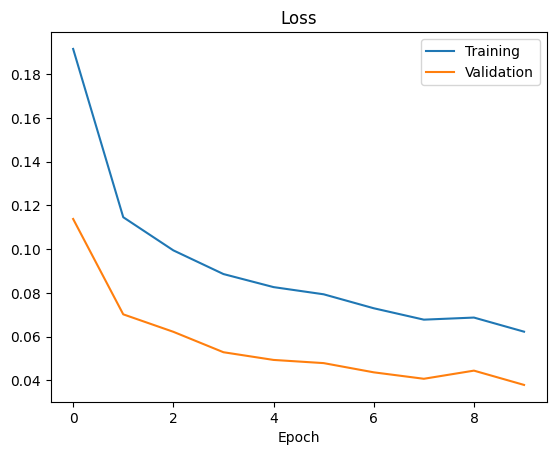

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save("model.h5")
from google.colab import files
files.download("model.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>